<a href="https://colab.research.google.com/github/er-Bot/NoteBooks/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import torch
import torch.nn as nn
from tqdm.auto import tqdm  

from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
from torchvision import transforms 

from torchvision.utils import make_grid
import matplotlib.pyplot as plt

## Load  Dataset 

In [3]:
data_path = "drive/MyDrive/Colab Notebooks/Data"
batch_size = 128

# Load MNIST dataset as tensors
dataloader = DataLoader(
  MNIST(
    data_path, 
    download = False, 
    transform = transforms.ToTensor()
  ),
  batch_size = batch_size,
  shuffle=True
)

## Architecture

In [263]:
class GAN:
  def __init__(self, z_dim, lr, device='cpu'):
    self.z_dim  = z_dim
    self.lr     = lr
    self.device = device

    self.gen    = self.Generator(self.z_dim).to(self.device)
    self.Gopt   = torch.optim.Adam(self.gen.parameters(), lr=self.lr)

    self.disc   = self.Discriminator().to(self.device) 
    self.Dopt   = torch.optim.Adam(self.disc.parameters(), lr=self.lr)
    

  def fit(self, dataloader, criterion, n_epochs, display_step=500, save_period=20):
    cur_step = 0
    Lg = []
    Ld = []

    for epoch in range(n_epochs):
      for real, _ in tqdm(dataloader):      # Dataloader returns the batches
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)  # Flatten the batch of real images

        """ Update discriminator """
        self.Dopt.zero_grad()     # Zero out the gradients before backpropagation
        disc_loss = self.disc_loss(criterion, real, cur_batch_size)
        disc_loss.backward(retain_graph=True)
        self.Dopt.step()

        """ Update generator """
        self.Gopt.zero_grad()
        gen_loss = self.gen_loss(criterion, cur_batch_size)
        gen_loss.backward()
        self.Gopt.step()

        Ld += [disc_loss.item()]
        Lg += [gen_loss.item()]

        """ Visualization code """
        if cur_step % display_step == 0 and cur_step > 0:
          print(f"Epoch {epoch}, step {cur_step}: Generator loss: {Lg}, discriminator loss: {Ld}")
          z  = self.noise(cur_batch_size)
          Xg = self.gen(z)
          self.show_tensor_images(Xg, title="step "+str(cur_step))
          step_bins = 20
          num_examples = (len(Lg) // step_bins) * step_bins
          plt.plot(
            range(num_examples // step_bins), 
            torch.Tensor(Lg[:num_examples]).view(-1, step_bins).mean(1),
            label="Generator Loss"
          )
          plt.plot(
            range(num_examples // step_bins), 
            torch.Tensor(Ld[:num_examples]).view(-1, step_bins).mean(1),
            label="Critic Loss"
          )
          plt.legend()
          plt.show()
        cur_step += 1
      if epoch % save_period == 0:
        print("save")
        torch.save(self.gen.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Models/GAN/GAN-%03d.h5' % epoch)

  ### ------------        Noise     --------------------- ###
  def noise(self, n_samples):
    return torch.randn(n_samples, self.z_dim, device=self.device)

  ### ------------ Generator Class --------------------- ###
  class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
      super().__init__()
      self.gen = nn.Sequential(
        self.generator_block(z_dim, hidden_dim),
        self.generator_block(hidden_dim, 2 * hidden_dim),
        self.generator_block(2 * hidden_dim, 4 * hidden_dim),
        self.generator_block(4 * hidden_dim, 8 * hidden_dim),
        nn.Linear(8 * hidden_dim, im_dim),
        nn.Sigmoid()
      )

    def generator_block(self, in_dim, out_dim):
      return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.BatchNorm1d(out_dim),
        nn.ReLU(inplace=True)
      )

    def forward(self, noise):
      return self.gen(noise)

  ### ------------ Discriminator Class --------------------- ###
  class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
      super().__init__()
      self.disc = nn.Sequential(
        self.discriminator_block(im_dim, 4 * hidden_dim),
        self.discriminator_block(4 * hidden_dim, 2 * hidden_dim),
        self.discriminator_block(2 * hidden_dim, hidden_dim),
        nn.Linear( hidden_dim, 1)
      )

    def discriminator_block(self, in_dim, out_dim):
      return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.LeakyReLU(0.2, inplace=True)
      )

    def forward(self, image):
      return self.disc(image)

  ### ------------      Loss functions   --------------------- ###
  def disc_loss(self, criterion, real, n_images):
    noise = self.noise(n_images)
    fake_image_gen = self.gen(noise)
    fake_image_pred = self.disc(fake_image_gen.detach())
    fake_image_loss = criterion(fake_image_pred, torch.zeros_like(fake_image_pred))
    
    real_image_pred = self.disc(real)
    real_image_loss = criterion(real_image_pred, torch.ones_like(real_image_pred))
    disc_loss = (fake_image_loss + real_image_loss) / 2
    return disc_loss
  def gen_loss(self, criterion, n_images):
    noise = self.noise(n_images)
    fake_image_gen = self.gen(noise)
    fake_image_pred = self.disc(fake_image_gen)

    gen_loss = criterion(fake_image_pred, torch.ones_like(fake_image_pred))
    return gen_loss

  ###                  Helpers                            ###
  def show_tensor_images(self, image_tensor, num_images=25, size=(1, 28, 28), title='title', nrow=5, figsize=(5, 5)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.figure(figsize=figsize)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.title(title)
    plt.show()


save



save


Epoch 21, step 10000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.816

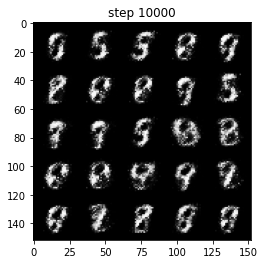

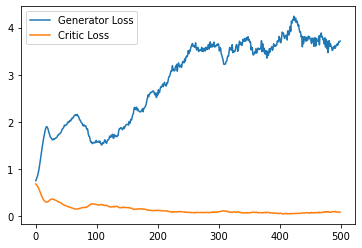


save


Epoch 42, step 20000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.816

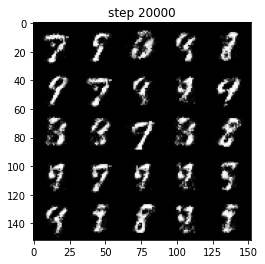

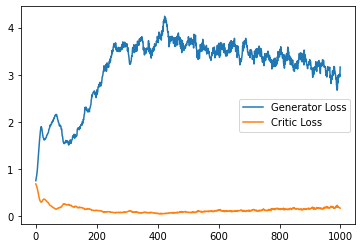


save


Epoch 63, step 30000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.816

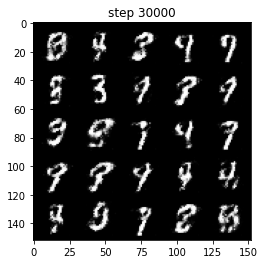

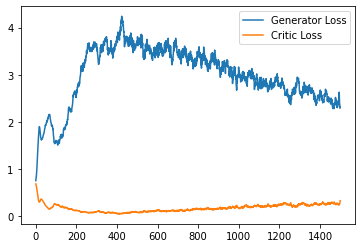


save


Epoch 85, step 40000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.816

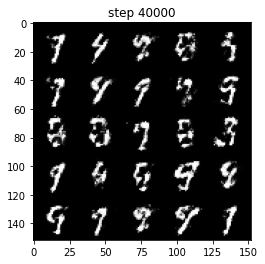

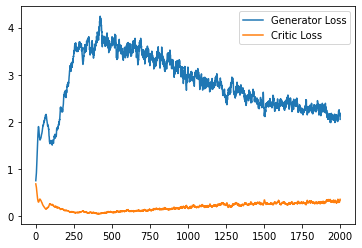


save


Epoch 106, step 50000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.81

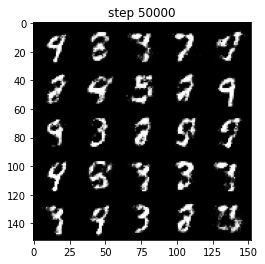

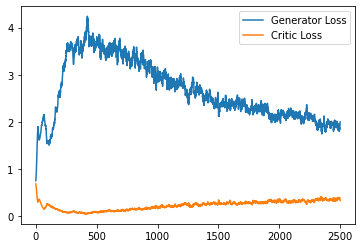


save


Epoch 127, step 60000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.81

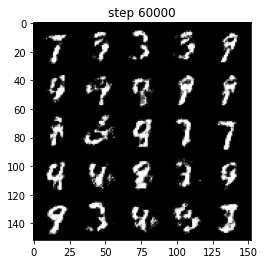

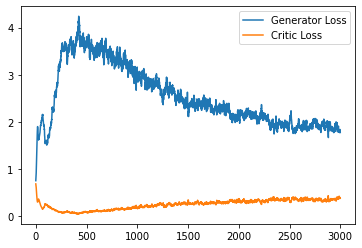


save


Epoch 149, step 70000: Generator loss: [0.7312896251678467, 0.7334274053573608, 0.7355508804321289, 0.7375559210777283, 0.7395833730697632, 0.741647481918335, 0.7436530590057373, 0.7454909086227417, 0.7474223375320435, 0.7492995262145996, 0.7511208057403564, 0.7529540061950684, 0.7546614408493042, 0.7565028667449951, 0.7582837343215942, 0.7598844766616821, 0.7616395950317383, 0.7634465098381042, 0.7651058435440063, 0.7669094800949097, 0.7685591578483582, 0.7701954245567322, 0.771788477897644, 0.7735438346862793, 0.7752683162689209, 0.776903510093689, 0.7785853147506714, 0.7801425457000732, 0.7819712162017822, 0.7835914492607117, 0.7852416038513184, 0.7869941592216492, 0.7885907888412476, 0.7903650403022766, 0.7919747829437256, 0.7937542796134949, 0.7953808307647705, 0.7971005439758301, 0.7988488674163818, 0.8005240559577942, 0.802186131477356, 0.8038278222084045, 0.8055615425109863, 0.8073053359985352, 0.8090653419494629, 0.8107931613922119, 0.8126001358032227, 0.8143665790557861, 0.81

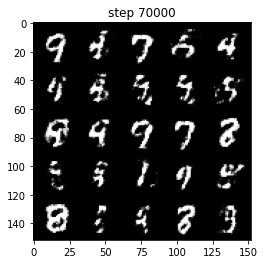

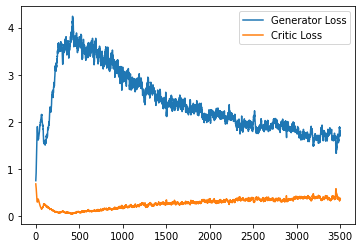


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



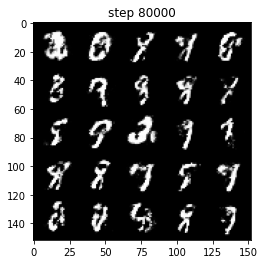

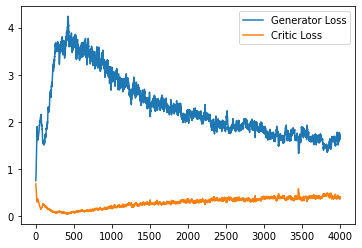


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



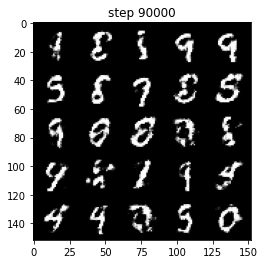

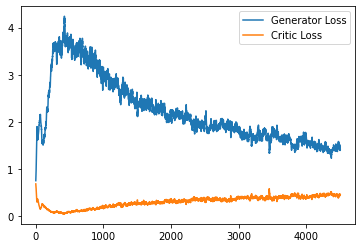


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



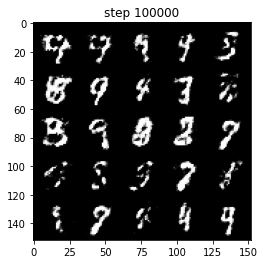

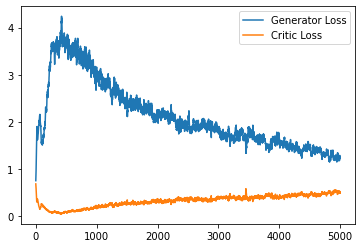


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



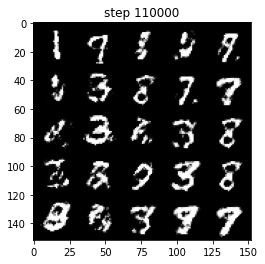

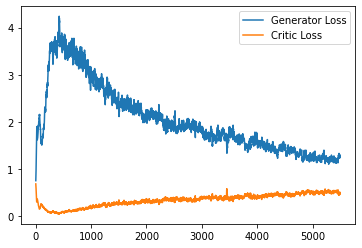


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



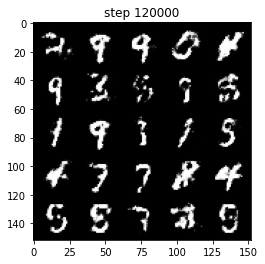

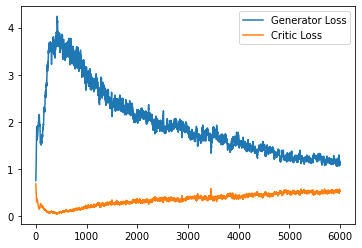


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



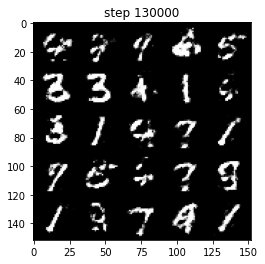

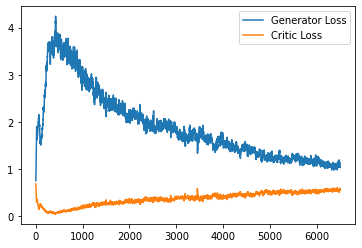


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



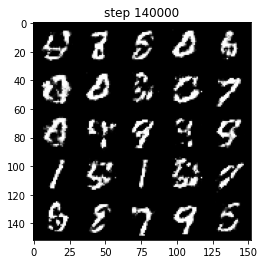

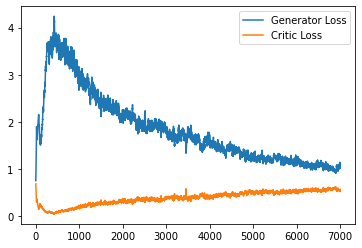


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



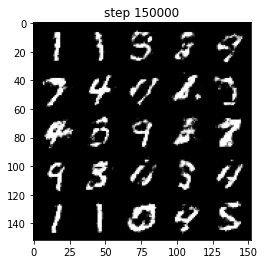

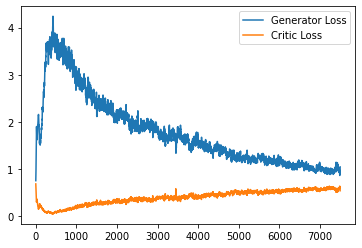


save



save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



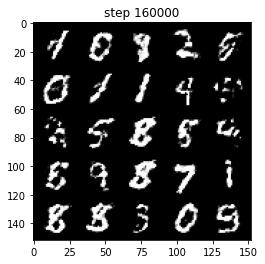

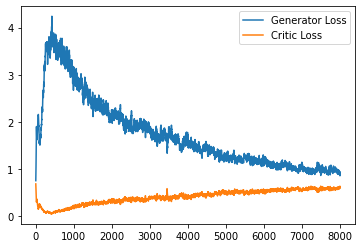


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



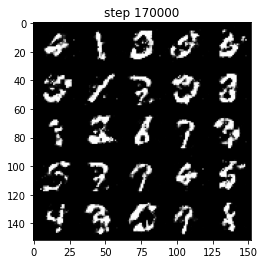

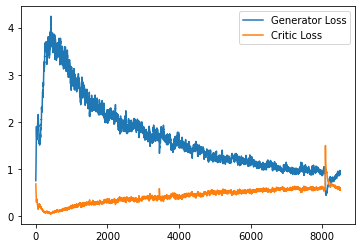


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



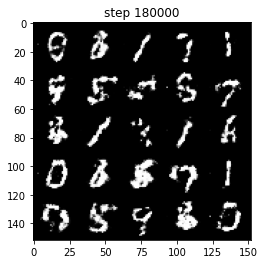

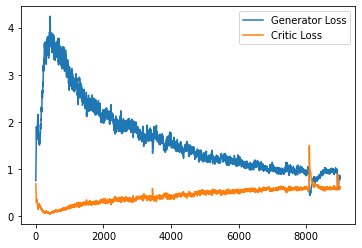


save


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



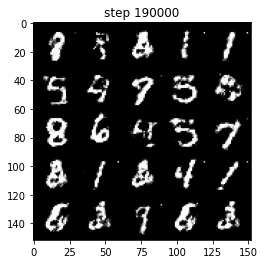

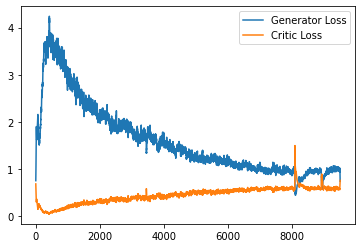

In [ ]:
criterion     = nn.BCEWithLogitsLoss()
n_epochs      = 20001
z_dim         = 64
lr            = 0.00001
device        = 'cuda'

gan = GAN(z_dim, lr, device)
gan.fit(dataloader, criterion, n_epochs, display_step = 10000, save_period=20)

In [250]:
criterion     = nn.BCEWithLogitsLoss()
n_epochs      = 2001
z_dim         = 64
lr            = 0.00001
device        = 'cuda'
gan = GAN(z_dim, lr, device)
gan.gen.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/Models/GAN/GAN-1240.h5"))

<All keys matched successfully>

In [183]:
z = gan.noise(100)

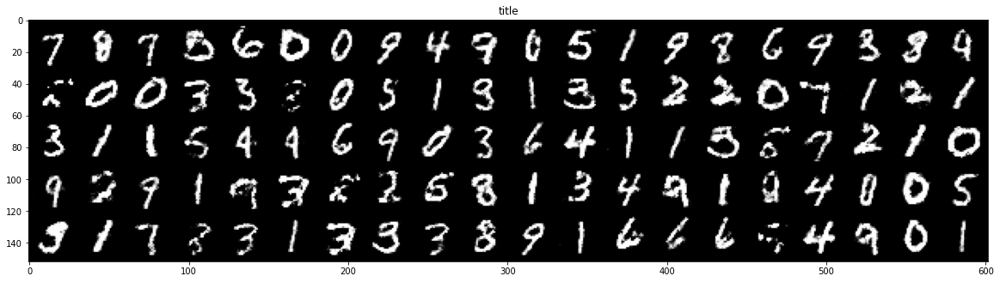

In [190]:
x = gan.gen(z)
gan.show_tensor_images(x, 100, nrow=20, figsize=(20,10))

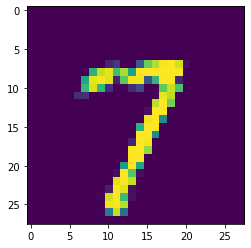

In [223]:
zn = gan.gen(z)
plt.imshow(zn[0].detach().cpu().reshape(28, 28))

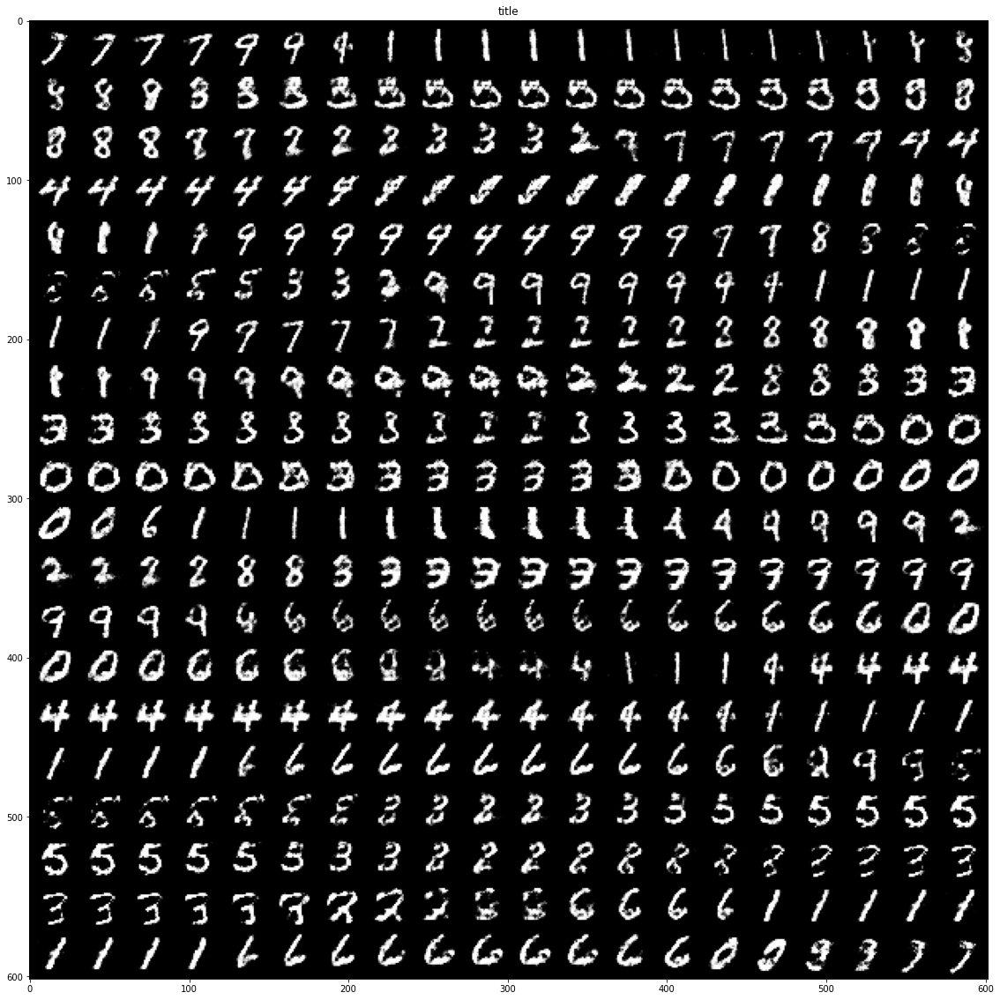

In [260]:
z = gan.noise(40)

def lerp(z, n):
  zs = []
  for i in range(len(z)):
    zs.append(z[i])
    for k in range(1, n):
      zs.append(z[i] + k * (z[(i+1)%len(z)] - z[i]) / (n-1))
  return torch.stack(zs)

z1 = z[0]
z2 = z[1]

zn = lerp(z, 10)
#zn = z

Xg1 = gan.gen(zn)
gan.show_tensor_images(Xg1, 999, len(zn), nrow=20, figsize=(20, 20))

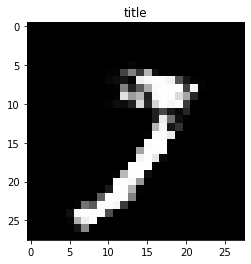

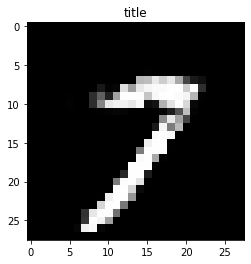

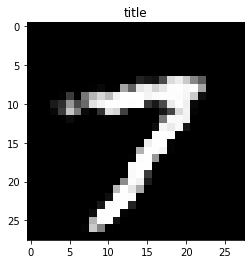

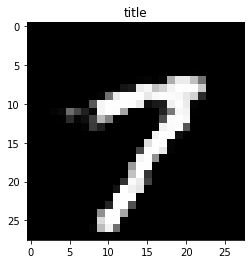

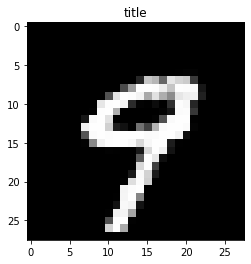

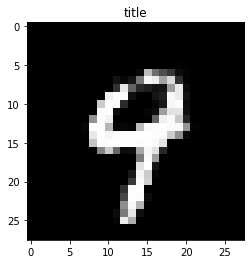

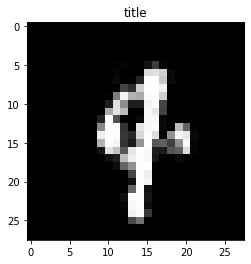

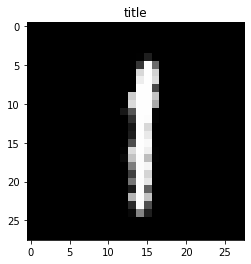

KeyboardInterrupt: ignored

In [265]:
def show_tensor_images(image_tensor, i, num_images=25, size=(1, 28, 28), title='title', nrow=5, figsize=(5, 5)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.figure(figsize=figsize)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.savefig('svg/e'+str(i)+'.png')
    plt.title(title)
    plt.show()

for i in range(len(Xg1)):
  show_tensor_images(Xg1[i], i, 1, nrow=1, figsize=(4, 4))

In [262]:
import imageio
images = []
for i in range(len(Xg1)):
  images.append(imageio.imread("svg/e"+str(i)+".png"))
imageio.mimsave('svg/aaaa.gif', images)